# Setup

In [1]:
!python3 -m pip install --upgrade --quiet google-genai

In [2]:
# download images, image_editing_utils.py (helper fns)
!gcloud storage cp gs://qwiklabs-gcp-00-5ea23e119474-bucket/empty-bowl-on-empty-table.png .
!gcloud storage cp gs://qwiklabs-gcp-00-5ea23e119474-bucket/image_editing_utils.py .
!gcloud storage cp gs://qwiklabs-gcp-00-5ea23e119474-bucket/place-setting-mask.png .

Copying gs://qwiklabs-gcp-00-5ea23e119474-bucket/empty-bowl-on-empty-table.png to file://./empty-bowl-on-empty-table.png

Average throughput: 148.8MiB/s
Copying gs://qwiklabs-gcp-00-5ea23e119474-bucket/image_editing_utils.py to file://./image_editing_utils.py
Copying gs://qwiklabs-gcp-00-5ea23e119474-bucket/place-setting-mask.png to file://./place-setting-mask.png


In [3]:
from google import genai
from google.genai.types import (
    Image,
    EditImageConfig,
    RawReferenceImage,
    MaskReferenceImage,
    MaskReferenceConfig,
)

import image_editing_utils

In [4]:
PROJECT_ID = "qwiklabs-gcp-00-5ea23e119474"
LOCATION = "us-central1"
gcs_bucket = "qwiklabs-gcp-00-5ea23e119474-bucket"

client = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=LOCATION
)

In [5]:
import os
os.environ

environ{'SHELL': '/bin/bash',
        'NV_LIBCUBLAS_VERSION': '12.5.3.2-1',
        'NVIDIA_VISIBLE_DEVICES': 'all',
        'NV_NVML_DEV_VERSION': '12.5.82-1',
        'NV_CUDNN_PACKAGE_NAME': 'libcudnn9-cuda-12',
        'NV_LIBNCCL_DEV_PACKAGE': 'libnccl-dev=2.22.3-1+cuda12.5',
        'NV_LIBNCCL_DEV_PACKAGE_VERSION': '2.22.3-1',
        'VERTEX_PRODUCT': 'COLAB_ENTERPRISE',
        'VM_GCE_METADATA_HOST': '169.254.169.254',
        'HOSTNAME': 'd68e430c931b',
        'LANGUAGE': 'en_US',
        'COLAB_TPU_1VM': '',
        'GOOGLE_CLOUD_PROJECT': 'qwiklabs-gcp-00-5ea23e119474',
        'GCE_METADATA_TIMEOUT': '3',
        'NVIDIA_REQUIRE_CUDA': 'cuda>=12.5 brand=unknown,driver>=470,driver<471 brand=grid,driver>=470,driver<471 brand=tesla,driver>=470,driver<471 brand=nvidia,driver>=470,driver<471 brand=quadro,driver>=470,driver<471 brand=quadrortx,driver>=470,driver<471 brand=nvidiartx,driver>=470,driver<471 brand=vapps,driver>=470,driver<471 brand=vpc,driver>=470,driver<471 brand

# Image

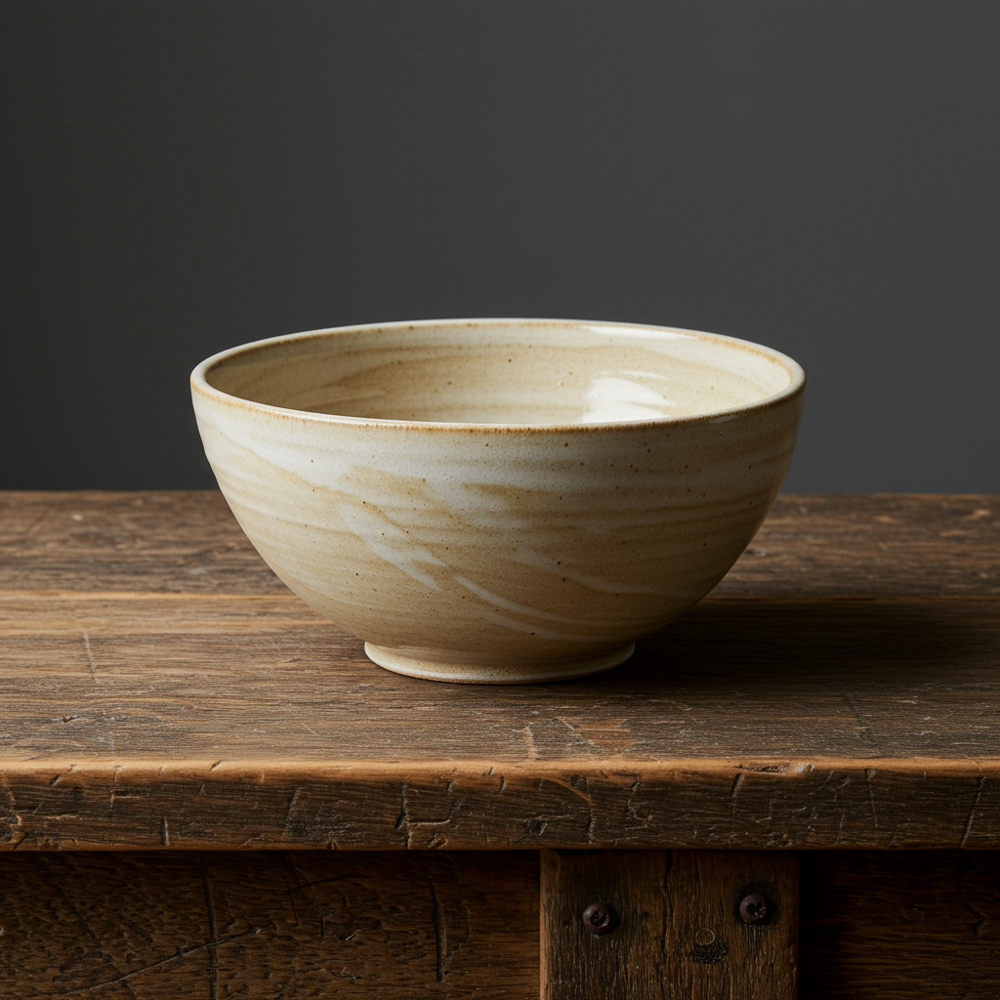

In [6]:
original_image = Image.from_file(
    location="empty-bowl-on-empty-table.png",
    mime_type="image/png"
)
original_image.show()

In [7]:
dest_filename = "empty-bowl-on-empty-table-copy.png"
original_image.save(dest_filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, dest_filename, dest_filename)

File empty-bowl-on-empty-table-copy.png uploaded to empty-bowl-on-empty-table-copy.png.


# Task 2. Use outpainting to expand your product image's aspect ratio
The original image provided by the product photographer is framed tightly around the bowl. You will first expand the image to have more surrounding pixels to do further image editing.


In [8]:
edit_model_name = "imagen-3.0-capability-001"

In [9]:
# Use a helper function to make both:

# a copy of the original image with blank space where you want to fill in
# a mask that indicates with while pixels where the editing model should generate new image pixels
target_image_size = (1408, 768)

reframed_image, reframed_mask = image_editing_utils.pad_and_mask_image(
    original_image=original_image,
    target_size=target_image_size,
    vertical_offset_from_bottom=0.5,
    horizontal_offset_from_left=0.1,
)

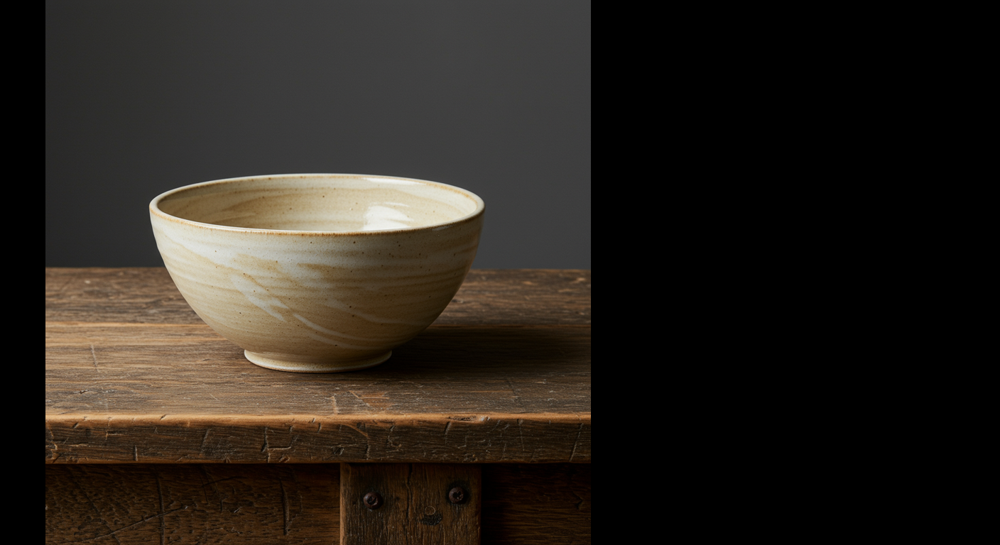

In [10]:
# View the reframed image by running this line in a new cell:

reframed_image.show()

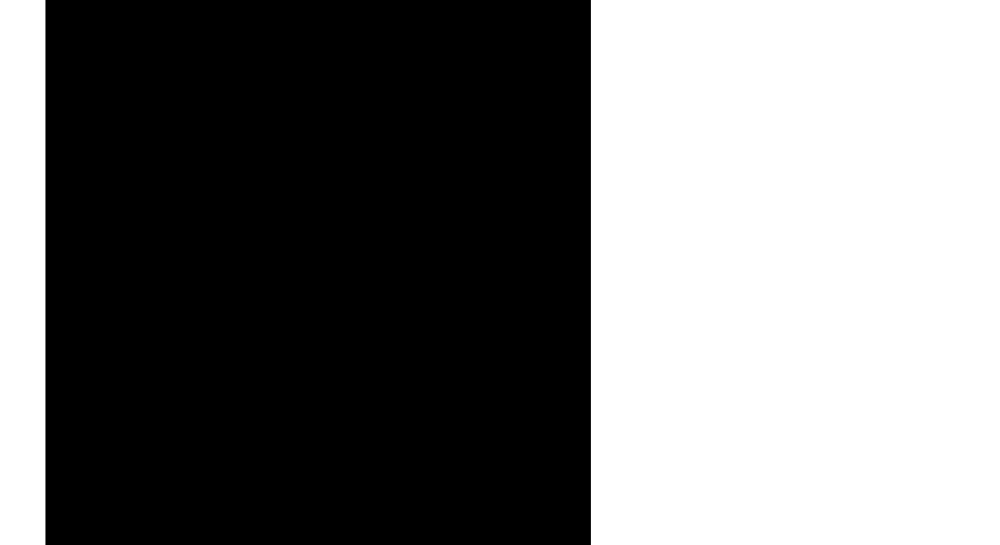

In [11]:
# View the reframed mask (black pixels corresponding to where you have image data, and white pixels corresponding to where new pixels will be generated) by running this line in a new cell:

reframed_mask.show()

In [12]:
# for code reference, visit: https://github.com/KaiquanMah/Training/blob/master/Google%20Cloud/Vertex/day1-Edit%20images%20with%20Imagen/imagen3_editing-Part2%20Inpaint%20Remove%2C%20Bkgd%20swap%2C%20Outpaint%2C%20Maskfree%20edit.ipynb

In [13]:
# Prepare a RawReferenceImage referencing your reframed_image and a MaskReferenceImage referencing your reframed_mask and providing a MaskReferenceConfig that specifies that this is a user-provided mask:

raw_ref_image = RawReferenceImage(
    # Fill in the appropriate configuration
    reference_image=reframed_image,
    reference_id=0
)

mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=reframed_mask,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_USER_PROVIDED",
    )
)

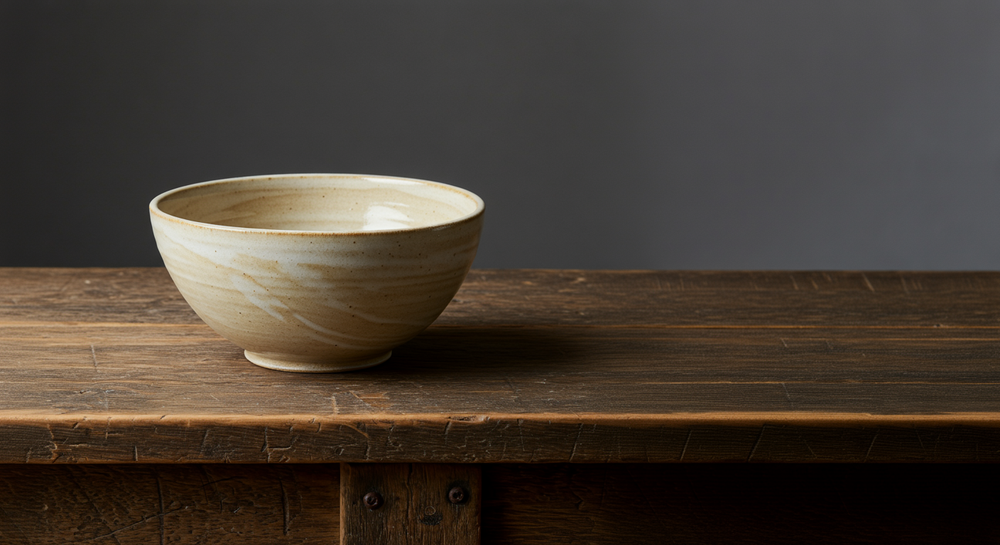

In [14]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE with the correct edit mode in the following cell and run it to expand the image to fill the empty pixels. You should see the resulting image shown after the cell:

outpainted_image = client.models.edit_image(
    model=edit_model_name,
    prompt="A simple, elegant, and clean photo of a bowl on a long wooden table.", # "",
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_OUTPAINT", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        base_steps=35,
        safety_filter_level="BLOCK_ONLY_HIGH",
    ),
)

outpainted_image.generated_images[0].image.show()

In [15]:
# Run the following code to save your outpainted_image locally and upload it to Cloud Storage:

filename = "empty-bowl-on-long-table.png"

outpainted_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File empty-bowl-on-long-table.png uploaded to empty-bowl-on-long-table.png.


# Task 3. Use mask-free editing to make changes to overlapping objects
Your marketing team asks if you can put some grapes in the bowl. Because these items will overlap with the bowl itself, you don't want to mask anything about, but rather edit the image generally.



In [16]:
outpaint_gcs_path = 'gs://' + gcs_bucket + '/' + filename
outpaint_gcs_path

'gs://qwiklabs-gcp-00-5ea23e119474-bucket/empty-bowl-on-long-table.png'

In [17]:
outpainted_image

EditImageResponse(
  generated_images=[
    GeneratedImage(
      image=Image(
        image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
        mime_type='image/png'
      ),
      safety_attributes=SafetyAttributes()
    ),
  ],
  sdk_http_response=HttpResponse(
    headers=<dict len=9>
  )
)

In [18]:
outpainted_image.generated_images[0].image

Image(
  image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
  mime_type='image/png'
)

In [19]:
# To make further edits on the image, reference the appropriate attribute of your outpainted_image to create a new RawReferenceImage.

raw_ref_image = RawReferenceImage(
    # need to be image bytes OR uri
    #      not 'outpainted_image' which is an 'EditImageResponse'
    reference_image= outpainted_image.generated_images[0].image, # Reference your outpainted image here,
    reference_id=0
)


In [20]:
raw_ref_image

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

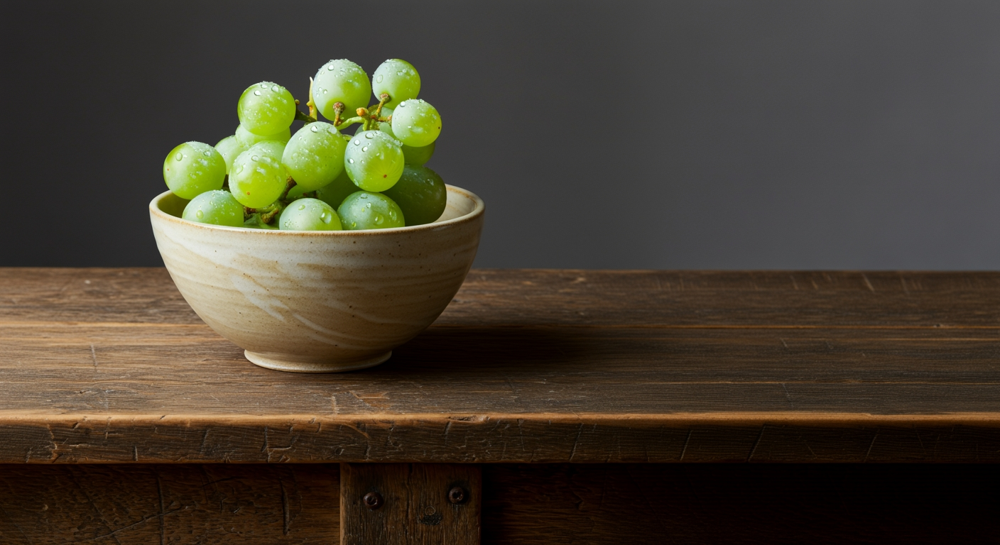

In [21]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to edit the image generally without using a mask. Run the code and make sure you see a result.

edit_prompt = "photoreal wet grapes added to the ceramic bowl[0]."
edited_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_DEFAULT", #ENTER_THE_CORRECT_EDIT_MODE ,
        base_steps=35,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

edited_image.generated_images[0].image.show()


In [22]:
filename = "grapes-in-bowl-on-long-table.png"

edited_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File grapes-in-bowl-on-long-table.png uploaded to grapes-in-bowl-on-long-table.png.


# Task 4. Use inpainting to insert objects into the scene
You will now use a mask to position some additional items to set a scene, providing more of a sense of the bowl being in a real place.



In [23]:
edited_image

EditImageResponse(
  generated_images=[
    GeneratedImage(
      image=Image(
        image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
        mime_type='image/png'
      ),
      safety_attributes=SafetyAttributes()
    ),
  ],
  sdk_http_response=HttpResponse(
    headers=<dict len=9>
  )
)

In [24]:
edited_image.generated_images[0].image

Image(
  image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
  mime_type='image/png'
)

In [25]:
# To continue editing this image, reference the appropriate attribute of your edited_image to create a new RawReferenceImage:

raw_ref_image = RawReferenceImage(
    reference_image= edited_image.generated_images[0].image, # Reference your edited image here,
    reference_id=0
)

In [26]:
raw_ref_image

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

In [27]:
# Load the place-setting-mask.png image that has been provided for you as the mask for the next step:

place_setting_mask = Image.from_file(location="place-setting-mask.png")
mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=place_setting_mask,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_USER_PROVIDED",
    )
)

place_setting_mask

Image(
  image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x11\xcfIDATx^\xed\xd6\xb1\r\x02\x01\x10\xc4@J\xa1\x14\xfao\nr\x87H\xf7\xc1j\xa6\t\xfb\xf5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00...',
  mime_type='image/png'
)

In [28]:
mask_ref_image

MaskReferenceImage(
  config=MaskReferenceConfig(
    mask_mode=<MaskReferenceMode.MASK_MODE_USER_PROVIDED: 'MASK_MODE_USER_PROVIDED'>
  ),
  mask_image_config=MaskReferenceConfig(
    mask_mode=<MaskReferenceMode.MASK_MODE_USER_PROVIDED: 'MASK_MODE_USER_PROVIDED'>
  ),
  reference_id=1,
  reference_image=Image(
    image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x11\xcfIDATx^\xed\xd6\xb1\r\x02\x01\x10\xc4@J\xa1\x14\xfao\nr\x87H\xf7\xc1j\xa6\t\xfb\xf5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_MASK'
)

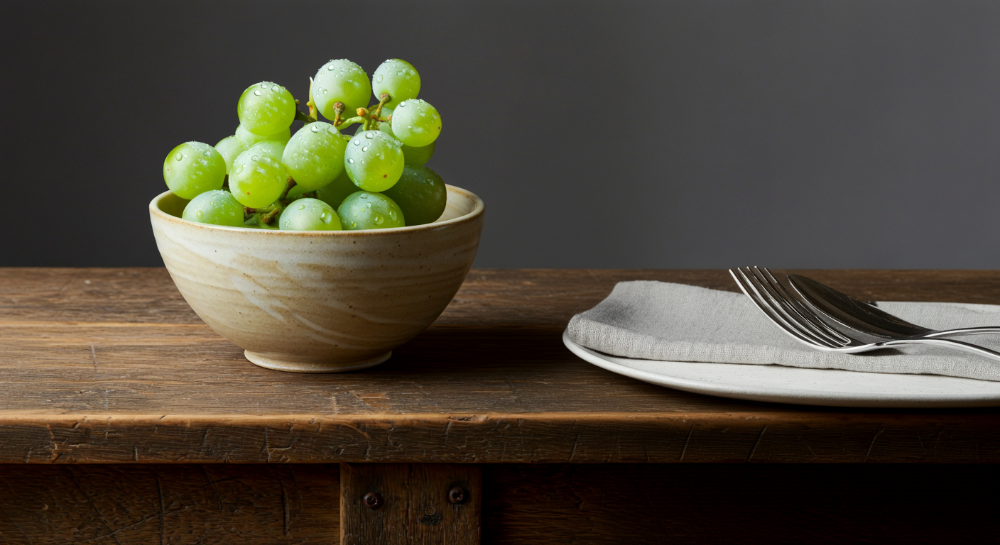

In [31]:
edit_prompt = "a fork on a napkin. both fork and napkin are on a PLATE, on the rustic table[1]"
inpainted_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_INPAINT_INSERTION", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

inpainted_image.generated_images[0].image.show()

In [32]:
filename = "grapes-and-table-setting-on-long-table.png"

inpainted_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File grapes-and-table-setting-on-long-table.png uploaded to grapes-and-table-setting-on-long-table.png.


# Task 5. Clear the table with inpainting removal
Your team is also interested in an empty background shot of the table without the bowl so that they can do some animation and compositing work. They ask if you can provide that for them.



In [33]:
inpainted_image

EditImageResponse(
  generated_images=[
    GeneratedImage(
      image=Image(
        image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
        mime_type='image/png'
      ),
      safety_attributes=SafetyAttributes()
    ),
  ],
  sdk_http_response=HttpResponse(
    headers=<dict len=9>
  )
)

In [34]:
inpainted_image.generated_images[0].image

Image(
  image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
  mime_type='image/png'
)

In [35]:
# Reference the appropriate attribute of your inpainted_image to create a new RawReferenceImage:

raw_ref_image = RawReferenceImage(
    reference_image= inpainted_image.generated_images[0].image, # Reference your inpainted image here,
    reference_id=0
)


In [36]:
raw_ref_image

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x80\x00\x00\x03\x00\x08\x02\x00\x00\x00\x12ST\x9b\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

In [37]:
# Create a MaskReferenceImage that will automatically detect the foreground objects in the provided reference image:

mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=None,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_FOREGROUND",
        mask_dilation=0.1,
    ),
)

mask_ref_image

MaskReferenceImage(
  config=MaskReferenceConfig(
    mask_dilation=0.1,
    mask_mode=<MaskReferenceMode.MASK_MODE_FOREGROUND: 'MASK_MODE_FOREGROUND'>
  ),
  mask_image_config=MaskReferenceConfig(
    mask_dilation=0.1,
    mask_mode=<MaskReferenceMode.MASK_MODE_FOREGROUND: 'MASK_MODE_FOREGROUND'>
  ),
  reference_id=1,
  reference_type='REFERENCE_TYPE_MASK'
)

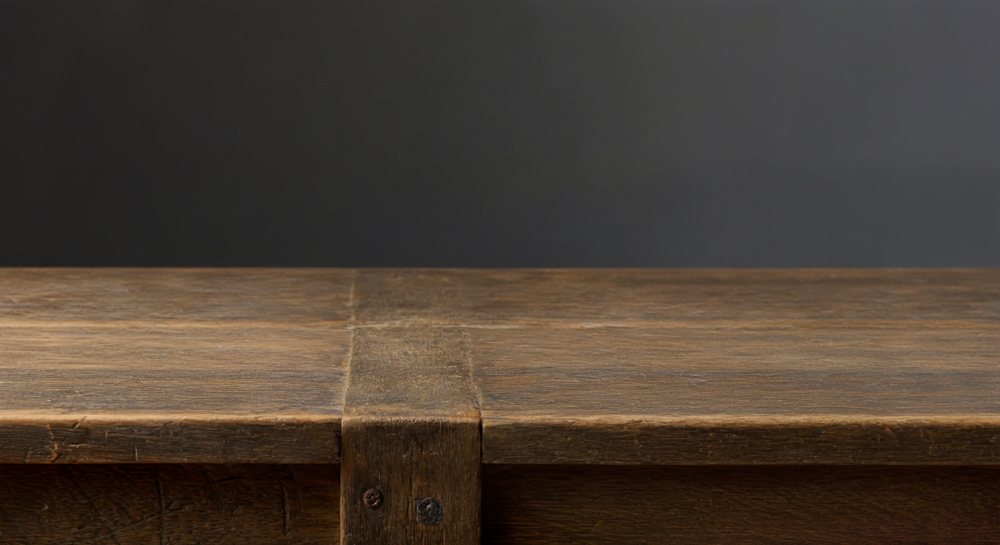

In [38]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to remove the foreground objects detected by the mask segmentation. Run the code and make sure you see a result.

edit_prompt = ""
foreground_removed_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_INPAINT_REMOVAL", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

foreground_removed_image.generated_images[0].image.show()


In [39]:
# Run the following code to save your foreground_removed_image locally and upload it to Cloud Storage:

filename = "empty-table.png"

foreground_removed_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File empty-table.png uploaded to empty-table.png.
